# Appliances Forecating

we are analyzing the Appliances which are used in January 2016 to May 2016 (6 months), and we will be predicting appliances for next five months which are June to Sept 2016.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

from prophet import Prophet
from sklearn.metrics import mean_absolute_error, root_mean_squared_error

In [23]:
#read CSV file
df=pd.read_csv('https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-GPXX032NEN/images/data/energydata_complete.csv')
df.tail()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
19730,27-05-2016 17:20,100,0,25.566667,46.560000,25.890000,42.025714,27.200000,41.163333,24.7,...,23.2,46.7900,22.7,755.2,55.666667,3.333333,23.666667,13.3,43.096812,43.096812
19731,27-05-2016 17:30,90,0,25.500000,46.500000,25.754000,42.080000,27.133333,41.223333,24.7,...,23.2,46.7900,22.6,755.2,56.000000,3.500000,24.500000,13.3,49.282940,49.282940
19732,27-05-2016 17:40,270,10,25.500000,46.596667,25.628571,42.768571,27.050000,41.690000,24.7,...,23.2,46.7900,22.5,755.2,56.333333,3.666667,25.333333,13.3,29.199117,29.199117
19733,27-05-2016 17:50,420,10,25.500000,46.990000,25.414000,43.036000,26.890000,41.290000,24.7,...,23.2,46.8175,22.3,755.2,56.666667,3.833333,26.166667,13.2,6.322784,6.322784
19734,27-05-2016 18:00,430,10,25.500000,46.600000,25.264286,42.971429,26.823333,41.156667,24.7,...,23.2,46.8450,22.2,755.2,57.000000,4.000000,27.000000,13.2,34.118851,34.118851


## Project workflow
1. preprocessing and EDA
datatype conversion
data cleaning: missing values, irregular dates() # note: prophet is able to handle missing values

EDA
visualize the data using a line plot to see the trends, seasonalities
decompose the data into trends, seasonalities and holidays to understand it more intrecately
X check for stationarity using ADF
#The goal is to identify the trend, seasonalities and holiday effects

modeling
create a base model, fit and predict
asses the model perfomance (using cross validation) and set it as the reffrence value for future tuning
create a future dataframe and asses the model components
visualize the predictions and actual values

#tune model
tune the models hyperparameters for better perfomance
asses perfomance & visualize the actual vs predicted values

interpretation and communication
#interpret the components
trend - increasing or decreasing
seasonalities - what are the dominant cycles; yearly, weekly
asses holiday effect

#communicate uncertainity
highlight prediction intervals to communicate forecast uncertainities

#communicate business insights
translate the forecast into actionable reccomendations




In [3]:
# lowercase columns for easier indexing
df.columns = [col.lower() for col in df.columns]

# shape and data features info
print('df shape\n',df.shape)
print(df.info())

df shape
 (19735, 29)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   t1           19735 non-null  float64
 4   rh_1         19735 non-null  float64
 5   t2           19735 non-null  float64
 6   rh_2         19735 non-null  float64
 7   t3           19735 non-null  float64
 8   rh_3         19735 non-null  float64
 9   t4           19735 non-null  float64
 10  rh_4         19735 non-null  float64
 11  t5           19735 non-null  float64
 12  rh_5         19735 non-null  float64
 13  t6           19735 non-null  float64
 14  rh_6         19735 non-null  float64
 15  t7           19735 non-null  float64
 16  rh_7         19735 non-null  float64
 17  t8           19735 non-null  float64
 18  rh_8         19735 non-n

In [4]:
# convert date column from object to datetime
df['date'] = pd.to_datetime(df['date'], dayfirst= True)

# print the number of unque dates
df['date'].nunique()

19735

In [6]:
data.head()

,date,appliances
0,2016-01-11 17:00:00,60
1,2016-01-11 17:10:00,60
2,2016-01-11 17:20:00,50
3,2016-01-11 17:30:00,50
4,2016-01-11 17:40:00,60


### Time series features:
the time series data exhibits high frequency time intervals, with data recorded after each ten minutes.
- this means that the data incoporates high seasonality and noise; to accurately forecast the data, its important to incorporate this information in the models hyperparameters.

In [5]:
# select the 2 columns to be used to forecast
data = df[['date', 'appliances']]

# visualize the data using line plot
fig = px.line(data, x='date', y='appliances', title= 'date vs appliances')
fig.show()

## Model Building

create a base model(model with no tuned hyperparameters), fit and predict.

asses the model perfomance (using cross validation) and set it as the reffrence value for future tuning

create a future dataframe and asses the model components

visualize the predictions and actual values

### Base model

In [12]:
# rename colums
data.columns = ['ds', 'y']

#initialize and fit model class
model = Prophet()
model.fit(data)

# create future dates
future_dates = model.make_future_dataframe(periods=150,
                                           freq='d',
                                           include_history=True
                                           )


# predict
preds = model.predict(future_dates)
preds.head()

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnrpf1ctc/4jpqo6pa.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnrpf1ctc/qx4fuoyr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92441', 'data', 'file=/tmp/tmpnrpf1ctc/4jpqo6pa.json', 'init=/tmp/tmpnrpf1ctc/qx4fuoyr.json', 'output', 'file=/tmp/tmpnrpf1ctc/prophet_model8qlehgkk/prophet_model-20250712195055.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:50:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:51:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2016-01-11 17:00:00,119.395080,58.717391,304.884243,119.395080,119.395080,58.284632,58.284632,58.284632,48.233546,48.233546,48.233546,10.051086,10.051086,10.051086,0.0,0.0,0.0,177.679712
1,2016-01-11 17:10:00,119.379624,62.775395,302.764806,119.379624,119.379624,62.829792,62.829792,62.829792,52.856772,52.856772,52.856772,9.973020,9.973020,9.973020,0.0,0.0,0.0,182.209416
2,2016-01-11 17:20:00,119.364169,76.285293,298.828748,119.364169,119.364169,67.145233,67.145233,67.145233,57.252747,57.252747,57.252747,9.892486,9.892486,9.892486,0.0,0.0,0.0,186.509401
3,2016-01-11 17:30:00,119.348713,73.153193,315.927523,119.348713,119.348713,71.138930,71.138930,71.138930,61.329432,61.329432,61.329432,9.809499,9.809499,9.809499,0.0,0.0,0.0,190.487643
4,2016-01-11 17:40:00,119.333257,72.510151,320.985780,119.333257,119.333257,74.723385,74.723385,74.723385,64.999310,64.999310,64.999310,9.724075,9.724075,9.724075,0.0,0.0,0.0,194.056642


In [13]:
# asses the model perfomance
y_pred = preds['yhat'][:19735].values

y_true = data['y'].values

mae = mean_absolute_error(y_pred, y_true)
print('mae:', mae)

mae: 52.739958345758744


{'additive': ['weekly', 'daily', 'additive_terms', 'extra_regressors_additive', 'holidays'], 'multiplicative': ['multiplicative_terms', 'extra_regressors_multiplicative']}


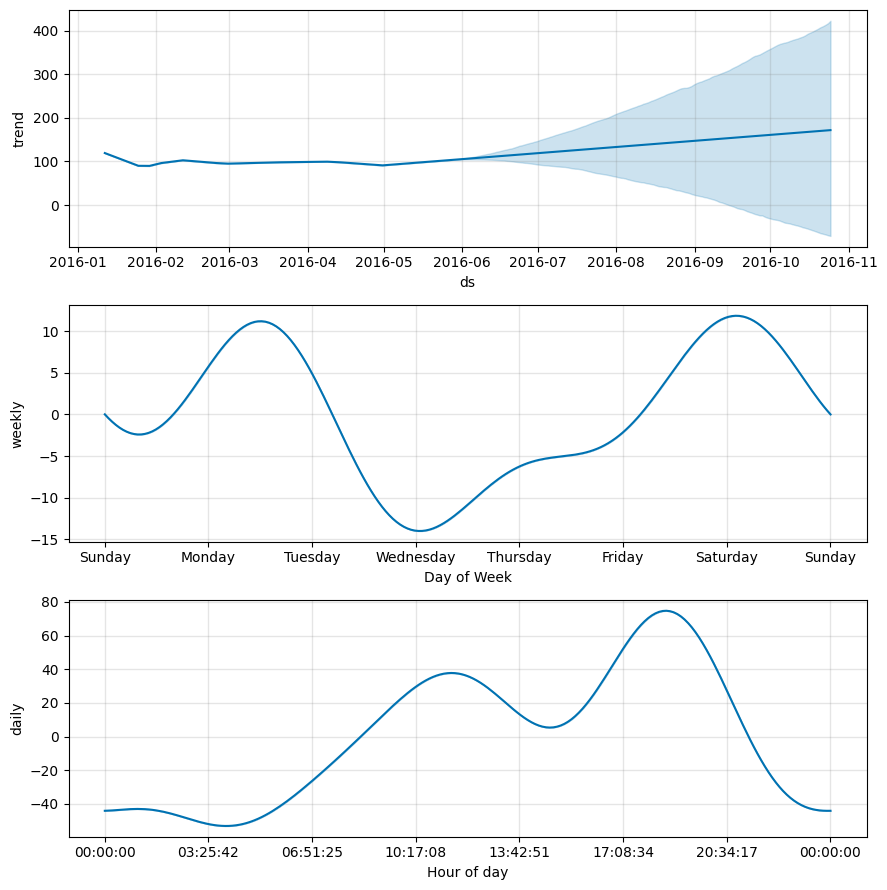

In [14]:
# print the model components
print(model.component_modes)

#plot the model  decomposed components
fig1 = model.plot_components(preds)
fig1.show()

### Understanding the Underlying patterns
(the y-axis represents the additive effect on the dependent variable for each time period; the default seasonality mode used for this model is additive)

-The overall trend of the time series is fairly constant, showing no significant rise or fall. The yearly seasonality therefore is not a significant variable in our model as the trend is fairly flat

-the weekly seasonality however show significant rises and falls across the weeks days.Monday and suturday are the days with the highest growth(values are typically 10 units higher than the average weekly units)

wednesday represents the lowest decline (values are more than 10 units lower than the average weekly units)

-daily fluctuations
values show significant fluctuation with units needed peaking around 6 to 7pm and the lowest units recorded at around 3am.



In [20]:
# investigating the time series trend
# print the models changepoints to see where the trend's slope significantly changes
print(model.changepoint_range)
print(model.changepoint_prior_scale)
print(model.n_changepoints)
print(model.changepoints_t)

0.8
0.05
25
[0.03197527 0.06400122 0.09597649 0.12800243 0.1599777  0.19200365
 0.22397892 0.25600486 0.28798014 0.32000608 0.35198135 0.3840073
 0.41598257 0.44800851 0.47998378 0.51200973 0.543985   0.57601095
 0.60798622 0.64001216 0.67198743 0.70401338 0.73598865 0.76801459
 0.79998987]


In [32]:
# investigate the model prediction residuals
residuals = preds['ds'][pd.date_range(start='11-01-2016 17:00', end='27-05-2016 18:00', freq='10min')]



,ds


In [33]:
# plot the predicted values plus the optimazations
trace_open = go.Scatter(x=preds['ds'],
                        y=preds['yhat'],
                        mode= 'lines',
                        name="forecast"
                        )
trace_high = go.Scatter(x=preds['ds'],
                        y=preds['yhat_upper'],
                        mode='lines',
                        fill="tonexty",
                        line = {"color": "#47b0fc"},
                        name= "higher uncertainity level"
                        )
trace_low = go.Scatter(x=preds['ds'],
                       y=preds['yhat_lower'],
                       mode='lines',
                       fill="tonexty",
                       line = {"color": "#57b8ff"},
                       name="lower uncertainity level"
                       )
trace_close = go.Scatter(x=data['ds'],
                         y=data['y'],
                         name="actual_values"
                         )

# make a list of all 3 scatle objects
data1 = [trace_open, trace_high, trace_low, trace_close]

# create a layout object
layout = go.Layout(title='Appliances Forecasting')

fig2 =go.Figure(data=data1)
fig2.show()

In [40]:
# plot_components using plotly
from prophet.plot import plot_components_plotly
fig = plot_components_plotly(model, preds)
fig.show()
from prophet.plot import plot_forecast_component_plotly

In [45]:
# plot the predicted vs actual values

fig = go.Figure([go.Scatter(x=data['ds'], y=data['y'],mode='lines',
                    name='Actual')])


fig.add_trace(go.Scatter(x=preds['ds'], y=preds['yhat'],
                   mode='lines+markers',
                    name='predicted'))

fig.show()


 Check crossvalidation part later

## Tune the base model

In [ ]:
#import crossvalidaion class from prophet
from prophet.diagnostics import cross_validation, performance_metrics, plot_cross_validation_metric

model1 = Prophet(yearly_seasonality=False,
                 weekly_seasonality=True,
                 daily_seasonality=True,
                 seasonality_prior_scale=1.0,
                 changepoint_prior_scale=30)

#model1.add_country_holidays()

model1.fit(data)

df_cv = cross_validation(
    model=model1,
    initial='180 days', # period to train
    period=30, #cutoff every 30days
    horizon='150 days' #period to predict
)


# compute perfomance metrics
df_perf = performance_metrics(df_cv)
df_perf

# visualize different perfomance metrics
fig_mse = plot_cross_validation_metric(df_cv, metric='mse')
plt.title('RMSE vs. Forecast Horizon')
fig_mse.show()

15:10:54 - cmdstanpy - INFO - Chain [1] start processing
15:11:31 - cmdstanpy - INFO - Chain [1] done processing


mae:
 51.9920356065763
rmse:
 93.20181432638756


In [ ]:
# use prophets inbuilt cross-validation
from prophet.diagnostics import cross_validation, performance_metrics

model_cv= cross_validation(model=model1,
                           initial=365,
                           period=180,
                           horizon=150
                           )

df_cv = performance_metrics(model_cv)
df_cv


Seasonality has period of 7 days which is larger than initial window. Consider increasing initial.
  0%|          | 0/19734 [00:00<?, ?it/s]


Exception: Less than two datapoints before cutoff. Increase initial window.

In [ ]:
model1.changepoints

526     2016-01-15 08:40:00
1052    2016-01-19 00:20:00
1579    2016-01-22 16:10:00
2105    2016-01-26 07:50:00
2631    2016-01-29 23:30:00
3157    2016-02-02 15:10:00
3684    2016-02-06 07:00:00
4210    2016-02-09 22:40:00
4736    2016-02-13 14:20:00
5262    2016-02-17 06:00:00
5789    2016-02-20 21:50:00
6315    2016-02-24 13:30:00
6841    2016-02-28 05:10:00
7367    2016-03-02 20:50:00
7894    2016-03-06 12:40:00
8420    2016-03-10 04:20:00
8946    2016-03-13 20:00:00
9472    2016-03-17 11:40:00
9998    2016-03-21 03:20:00
10525   2016-03-24 19:10:00
11051   2016-03-28 10:50:00
11577   2016-04-01 02:30:00
12103   2016-04-04 18:10:00
12630   2016-04-08 10:00:00
13156   2016-04-12 01:40:00
13682   2016-04-15 17:20:00
14208   2016-04-19 09:00:00
14735   2016-04-23 00:50:00
15261   2016-04-26 16:30:00
15787   2016-04-30 08:10:00
Name: ds, dtype: datetime64[ns]

In [ ]:
# plot the predicted vs the actual values
fig3= go.Figure([go.Scatter(x=data['ds'],
                            y=data['y'],
                            mode='lines',
                            name='Actual values'
                            )])

fig3.add_trace(go.Scatter(x=preds1['ds'],
                          y=preds1['yhat'],
                          mode='lines+markers',
                          name= 'Forecast values'
                          ))

fig3.show()

## interpretation and communication

### Interpreting the time series components
- Trend: From the decomposed model components, the trend of the time series is stagnant without a significant rise of fall

- Seasonalities: the time series shows significant cycles in weekly and daily periods with weekly seasonalities showing significant impact

#communicate uncertainity
highlight prediction intervals to communicate forecast uncertainities

#communicate business insights
translate the forecast into actionable reccomendations